# Выпускная квалификационная работа по курсу «Data Science»

### Загружаем данные

In [1]:
import pandas as pd
import numpy as np
import copy
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import stats
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import MinMaxScaler
from sklearn.neighbors import KNeighborsRegressor
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score
from sklearn.preprocessing import LabelEncoder
from sklearn.neural_network import MLPRegressor
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn import metrics
from sklearn.metrics import mean_absolute_error
print(tf.__version__)

2.12.0


In [2]:
xbp_dataFrame = pd.read_excel("Датасет для ВКР_композиты/X_bp.xlsx", index_col=0)
xnup_dataFrame = pd.read_excel("Датасет для ВКР_композиты/X_nup.xlsx", index_col=0)

In [3]:
pd.DataFrame(xnup_dataFrame.columns, columns=['характиристики нашивок'])

,характиристики нашивок
0,"Угол нашивки, град"
1,Шаг нашивки
2,Плотность нашивки


In [4]:
pd.DataFrame(xbp_dataFrame.columns, columns=['характиристики базальтопластика'])

,характиристики базальтопластика
0,Соотношение матрица-наполнитель
1,"Плотность, кг/м3"
2,"модуль упругости, ГПа"
3,"Количество отвердителя, м.%"
4,"Содержание эпоксидных групп,%_2"
5,"Температура вспышки, С_2"
6,"Поверхностная плотность, г/м2"
7,"Модуль упругости при растяжении, ГПа"
8,"Прочность при растяжении, МПа"
9,"Потребление смолы, г/м2"


In [5]:
xbp_dataFrame.shape

(1023, 10)

In [6]:
xnup_dataFrame.shape

(1040, 3)

In [7]:
xbp_dataFrame.head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2"
0,1.857143,2030.0,738.736842,30.00,22.267857,100.000000,210.0,70.0,3000.0,220.0
1,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0
2,1.857143,2030.0,738.736842,49.90,33.000000,284.615385,210.0,70.0,3000.0,220.0
3,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0
4,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0


In [8]:
xnup_dataFrame.head()

,"Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,0,4.0,57.0
1,0,4.0,60.0
2,0,4.0,70.0
3,0,5.0,47.0
4,0,5.0,57.0


### Объединяем два файла X_bp.xlsx и X_nup.xslx по индексу, тип объединения INNER.

In [9]:
join_dataFrame = xbp_dataFrame.join(xnup_dataFrame, how='inner')

In [10]:
join_dataFrame.shape

(1023, 13)

In [11]:
join_dataFrame.head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,1.857143,2030.0,738.736842,30.00,22.267857,100.000000,210.0,70.0,3000.0,220.0,0,4.0,57.0
1,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0,0,4.0,60.0
2,1.857143,2030.0,738.736842,49.90,33.000000,284.615385,210.0,70.0,3000.0,220.0,0,4.0,70.0
3,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0,0,5.0,47.0
4,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0,5.0,57.0


In [12]:
pd.DataFrame(join_dataFrame.columns, columns=['характиристики композиционных материалов в join_dataFrame'])

,характиристики композиционных материалов в join_dataFrame
0,Соотношение матрица-наполнитель
1,"Плотность, кг/м3"
2,"модуль упругости, ГПа"
3,"Количество отвердителя, м.%"
4,"Содержание эпоксидных групп,%_2"
5,"Температура вспышки, С_2"
6,"Поверхностная плотность, г/м2"
7,"Модуль упругости при растяжении, ГПа"
8,"Прочность при растяжении, МПа"
9,"Потребление смолы, г/м2"


## Анализ таблицы

In [13]:
join_dataFrame.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1023 entries, 0 to 1022
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       1023 non-null   float64
 1   Плотность, кг/м3                      1023 non-null   float64
 2   модуль упругости, ГПа                 1023 non-null   float64
 3   Количество отвердителя, м.%           1023 non-null   float64
 4   Содержание эпоксидных групп,%_2       1023 non-null   float64
 5   Температура вспышки, С_2              1023 non-null   float64
 6   Поверхностная плотность, г/м2         1023 non-null   float64
 7   Модуль упругости при растяжении, ГПа  1023 non-null   float64
 8   Прочность при растяжении, МПа         1023 non-null   float64
 9   Потребление смолы, г/м2               1023 non-null   float64
 10  Угол нашивки, град                    1023 non-null   int64  
 11  Шаг нашивки      

## Описательная статистика характеристик композиционных материалов

In [14]:
join_dataFrame.describe().T

,count,mean,std,min,25%,50%,75%,max
Соотношение матрица-наполнитель,1023.0,2.930366,0.913222,0.389403,2.317887,2.906878,3.552660,5.591742
"Плотность, кг/м3",1023.0,1975.734888,73.729231,1731.764635,1924.155467,1977.621657,2021.374375,2207.773481
"модуль упругости, ГПа",1023.0,739.923233,330.231581,2.436909,500.047452,739.664328,961.812526,1911.536477
"Количество отвердителя, м.%",1023.0,110.570769,28.295911,17.740275,92.443497,110.564840,129.730366,198.953207
"Содержание эпоксидных групп,%_2",1023.0,22.244390,2.406301,14.254985,20.608034,22.230744,23.961934,33.000000
"Температура вспышки, С_2",1023.0,285.882151,40.943260,100.000000,259.066528,285.896812,313.002106,413.273418
"Поверхностная плотность, г/м2",1023.0,482.731833,281.314690,0.603740,266.816645,451.864365,693.225017,1399.542362
"Модуль упругости при растяжении, ГПа",1023.0,73.328571,3.118983,64.054061,71.245018,73.268805,75.356612,82.682051
"Прочность при растяжении, МПа",1023.0,2466.922843,485.628006,1036.856605,2135.850448,2459.524526,2767.193119,3848.436732
"Потребление смолы, г/м2",1023.0,218.423144,59.735931,33.803026,179.627520,219.198882,257.481724,414.590628


## Количество уникальных значений

In [15]:
join_dataFrame.nunique()

Соотношение матрица-наполнитель         1014
Плотность, кг/м3                        1013
модуль упругости, ГПа                   1020
Количество отвердителя, м.%             1005
Содержание эпоксидных групп,%_2         1004
Температура вспышки, С_2                1003
Поверхностная плотность, г/м2           1004
Модуль упругости при растяжении, ГПа    1004
Прочность при растяжении, МПа           1004
Потребление смолы, г/м2                 1003
Угол нашивки, град                         2
Шаг нашивки                              989
Плотность нашивки                        988
dtype: int64

In [16]:
join_dataFrame.duplicated().sum()

0

In [17]:
join_dataFrame.isna().sum()

Соотношение матрица-наполнитель         0
Плотность, кг/м3                        0
модуль упругости, ГПа                   0
Количество отвердителя, м.%             0
Содержание эпоксидных групп,%_2         0
Температура вспышки, С_2                0
Поверхностная плотность, г/м2           0
Модуль упругости при растяжении, ГПа    0
Прочность при растяжении, МПа           0
Потребление смолы, г/м2                 0
Угол нашивки, град                      0
Шаг нашивки                             0
Плотность нашивки                       0
dtype: int64

## Гистограммы

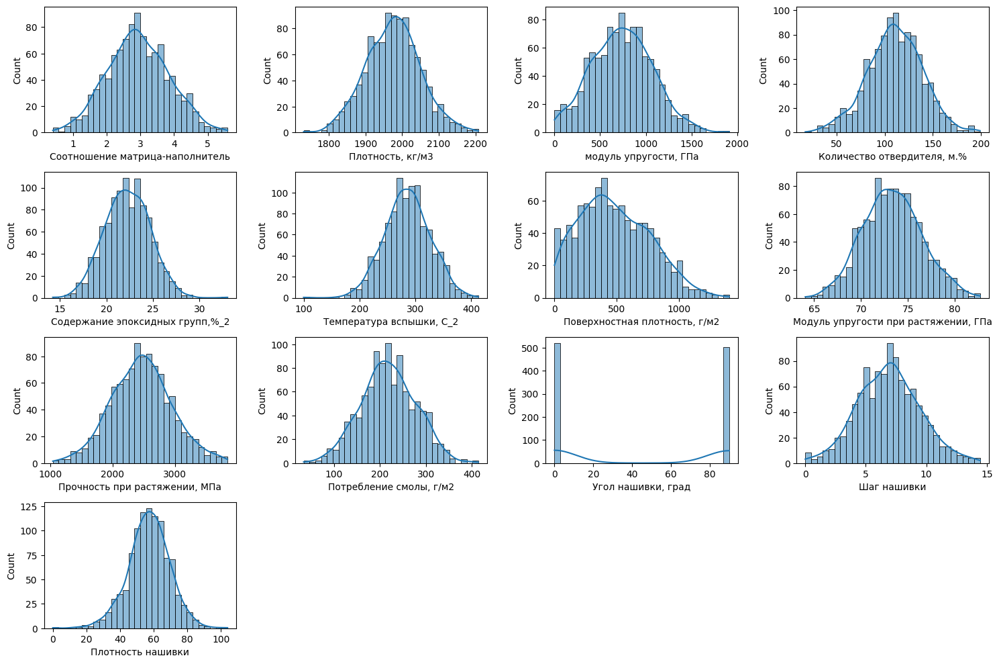

In [18]:
def histodraw(df, variables, n_rows, n_cols):
    fig=plt.figure(figsize=(15, 10))
    for i, var_name in enumerate(variables):
        ax=fig.add_subplot(n_rows,n_cols,i+1)
        sns.histplot(data=join_dataFrame, x=var_name, kde=True, bins=30)
    fig.tight_layout()
    plt.show()

histodraw(join_dataFrame, join_dataFrame.columns, 4, 4)

 ## Попарные графики рассеяния


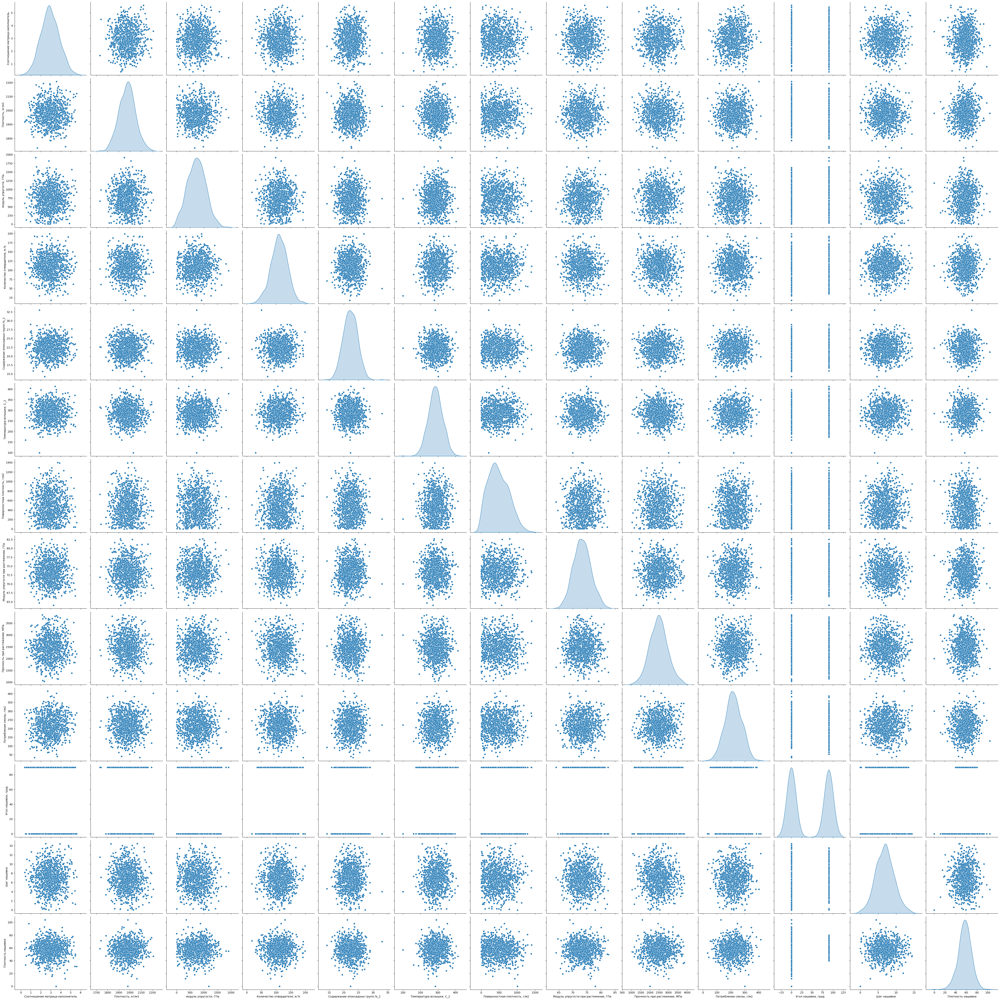

In [19]:
sns.pairplot(join_dataFrame, height=4, diag_kind='kde');

# Диаграмма "Ящик с усами" до удаления выбросов

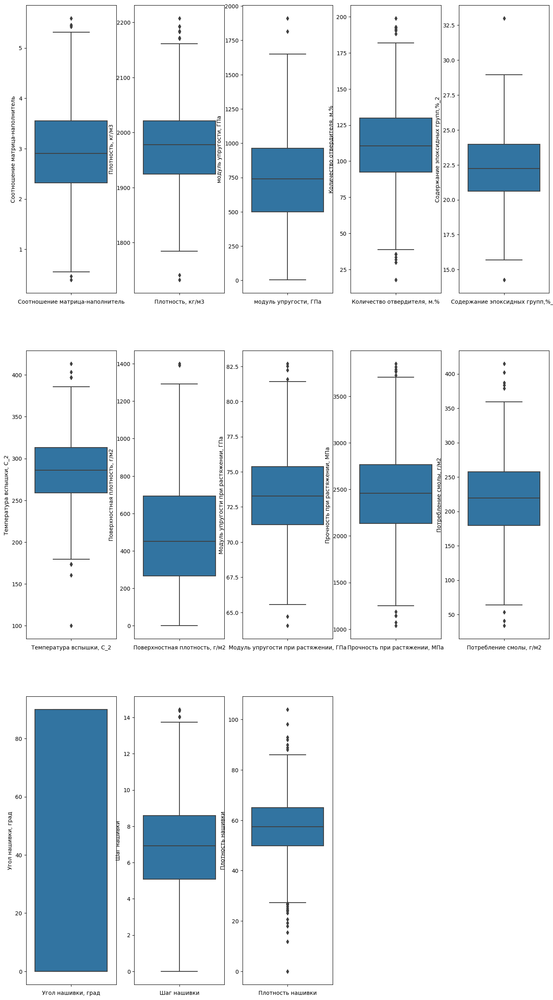

In [20]:
n = 1  # счетчик
s = 3  # строки
c = 5  # столбцы


fig = plt.figure(figsize=(17, 32))

for i in join_dataFrame.columns:
    plt.subplot(s, c, n)
    plt.xlabel(i)
    sns.boxplot(y = join_dataFrame[i])
    n = n + 1
   
plt.show()

# Визуализация данных с помощью корреляционной матрицы до удаления выбросов

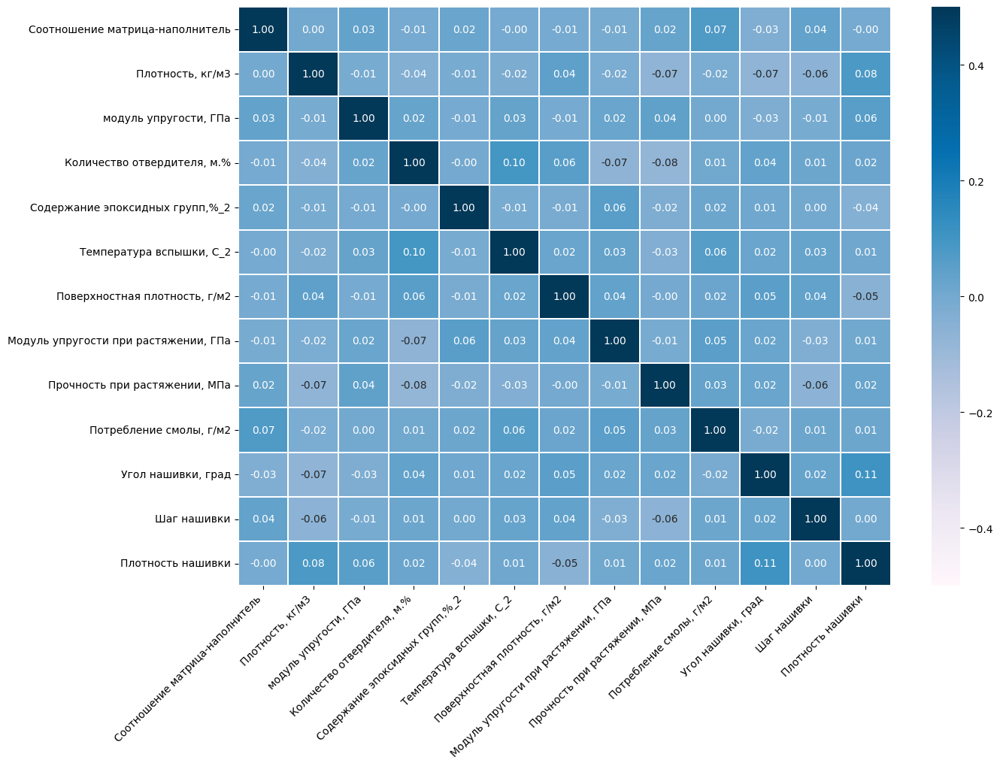

In [21]:
cor_map = join_dataFrame.corr()
fig, ax = plt.subplots(figsize=(14, 10))
sns.heatmap(cor_map, vmin=-0.5, vmax=0.5, annot=True, fmt='.2f',cmap='PuBu', ax=ax, linewidths = 0.1)
plt.xticks(rotation=45, ha='right')
plt.show()

## Корреляции между переменными на тепловой карте визуально не выявлено

# Сравнение двух методов удаления выбросов: 3-х сигм или межквартильных расстояний

In [22]:
sgm = 0
iqd= 0
for column in join_dataFrame:
    d = join_dataFrame.loc[:, [column]]
   
    # методом 3-х сигм
    zscore = (join_dataFrame[column] - join_dataFrame[column].mean()) / join_dataFrame[column].std()
    d['3s'] = zscore.abs() > 3
    sgm += d['3s'].sum()
   
    # методом межквартильных расстояний
    q1 = np.quantile(join_dataFrame[column], 0.25)
    q3 = np.quantile(join_dataFrame[column], 0.75)
    iqr = q3 - q1
    lower = q1 - 1.5 * iqr
    upper = q3 + 1.5 * iqr
    d['iq'] = (join_dataFrame[column] <= lower) | (join_dataFrame[column] >= upper)
    iqd+= d['iq'].sum()
print( sgm,'-- выброс методом 3-х сигм',)
print( iqd,'-- выброс методом межквартильных расстояний',)

24 -- выброс методом 3-х сигм
93 -- выброс методом межквартильных расстояний


# Распределение выбросов по характеристикам

In [23]:
temp_dataFrame = join_dataFrame.copy()
for i in join_dataFrame.columns:
    print('\n')
    temp_dataFrame[i] = abs((join_dataFrame[i] - join_dataFrame[i].mean()) / join_dataFrame[i].std())
    print(f"{sum(temp_dataFrame[i] > 3)} -> выбросов в признаке: '{i}'")
print(f' Всего - {sum(sum(temp_dataFrame.values > 3))} выброса')



0 -> выбросов в признаке: 'Соотношение матрица-наполнитель'


3 -> выбросов в признаке: 'Плотность, кг/м3'


2 -> выбросов в признаке: 'модуль упругости, ГПа'


2 -> выбросов в признаке: 'Количество отвердителя, м.%'


2 -> выбросов в признаке: 'Содержание эпоксидных групп,%_2'


3 -> выбросов в признаке: 'Температура вспышки, С_2'


2 -> выбросов в признаке: 'Поверхностная плотность, г/м2'


0 -> выбросов в признаке: 'Модуль упругости при растяжении, ГПа'


0 -> выбросов в признаке: 'Прочность при растяжении, МПа'


3 -> выбросов в признаке: 'Потребление смолы, г/м2'


0 -> выбросов в признаке: 'Угол нашивки, град'


0 -> выбросов в признаке: 'Шаг нашивки'


7 -> выбросов в признаке: 'Плотность нашивки'
 Всего - 24 выброса


## "Угол нашивки" закодируем с помощью LabelEncoder

In [24]:
le = LabelEncoder()
join_dataFrame['Угол нашивки, град'] = le.fit_transform(join_dataFrame['Угол нашивки, град'])


# Удаление выбросов

In [25]:
join_dataFrame_drop = join_dataFrame[(np.abs(stats.zscore(join_dataFrame)) <= 3).all(axis=1)]

join_dataFrame_drop

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
1,1.857143,2030.000000,738.736842,50.000000,23.750000,284.615385,210.000000,70.000000,3000.000000,220.000000,0,4.000000,60.000000
3,1.857143,2030.000000,738.736842,129.000000,21.250000,300.000000,210.000000,70.000000,3000.000000,220.000000,0,5.000000,47.000000
4,2.771331,2030.000000,753.000000,111.860000,22.267857,284.615385,210.000000,70.000000,3000.000000,220.000000,0,5.000000,57.000000
5,2.767918,2000.000000,748.000000,111.860000,22.267857,284.615385,210.000000,70.000000,3000.000000,220.000000,0,5.000000,60.000000
6,2.569620,1910.000000,807.000000,111.860000,22.267857,284.615385,210.000000,70.000000,3000.000000,220.000000,0,5.000000,70.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1018,2.271346,1952.087902,912.855545,86.992183,20.123249,324.774576,209.198700,73.090961,2387.292495,125.007669,1,9.076380,47.019770
1019,3.444022,2050.089171,444.732634,145.981978,19.599769,254.215401,350.660830,72.920827,2360.392784,117.730099,1,10.565614,53.750790
1020,3.280604,1972.372865,416.836524,110.533477,23.957502,248.423047,740.142791,74.734344,2662.906040,236.606764,1,4.161154,67.629684
1021,3.705351,2066.799773,741.475517,141.397963,19.246945,275.779840,641.468152,74.042708,2071.715856,197.126067,1,6.313201,58.261074


# "Ящик с усами" после удаления выбросов

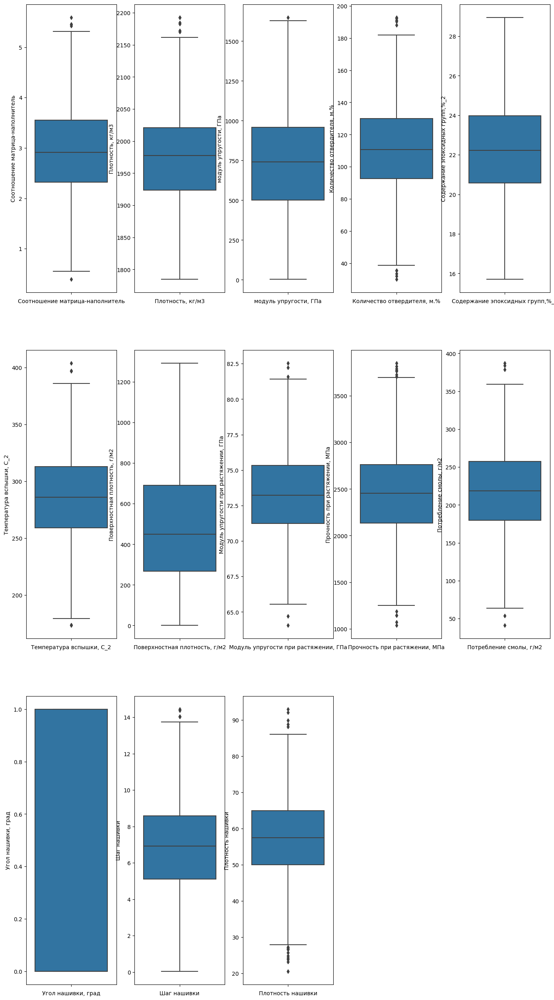

In [26]:
n = 1  # счетчик
s = 3  # строки
c = 5  # столбцы


fig = plt.figure(figsize=(17, 32))

for i in join_dataFrame_drop.columns:
    plt.subplot(s, c, n)
    plt.xlabel(i)
    sns.boxplot(y = join_dataFrame_drop[i])
    n = n + 1
   
plt.show()

# Корреляционная матрицы после удаления выбросов

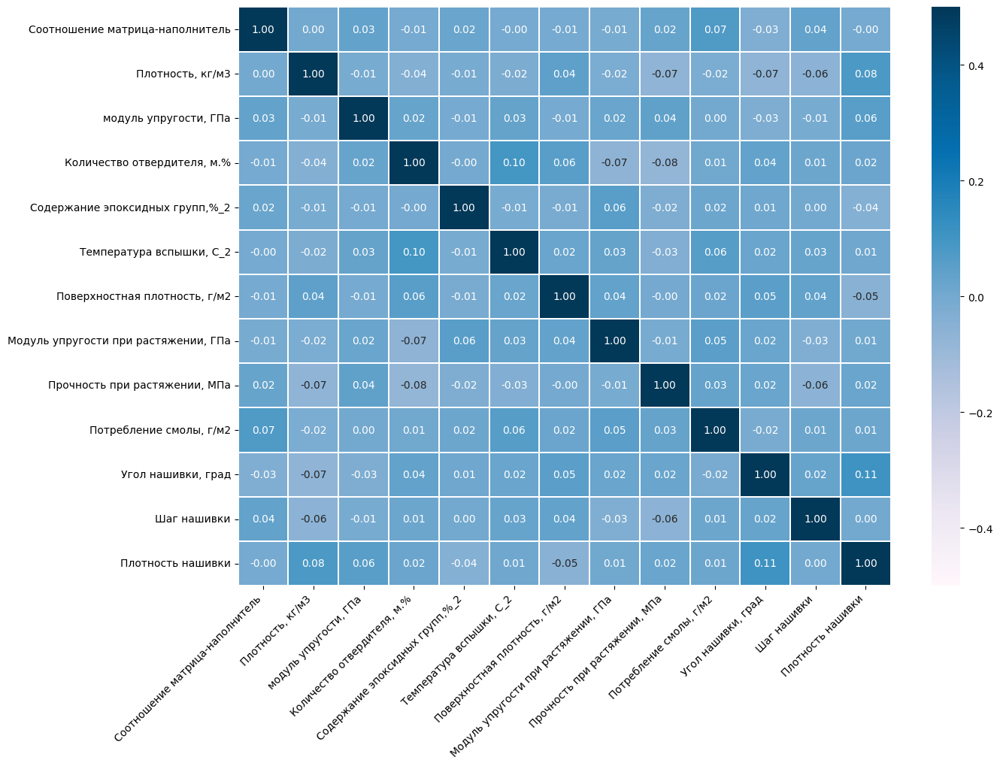

In [27]:
cor_map = join_dataFrame.corr()
fig, ax = plt.subplots(figsize=(14, 10))
sns.heatmap(cor_map, vmin=-0.5, vmax=0.5, annot=True, fmt='.2f',cmap='PuBu', ax=ax, linewidths = 0.1)
plt.xticks(rotation=45, ha='right')
plt.show()

## Корреляции между переменными на тепловой карте визуально не выявлена

# Оценка плотности ядра

<Axes: ylabel='Density'>

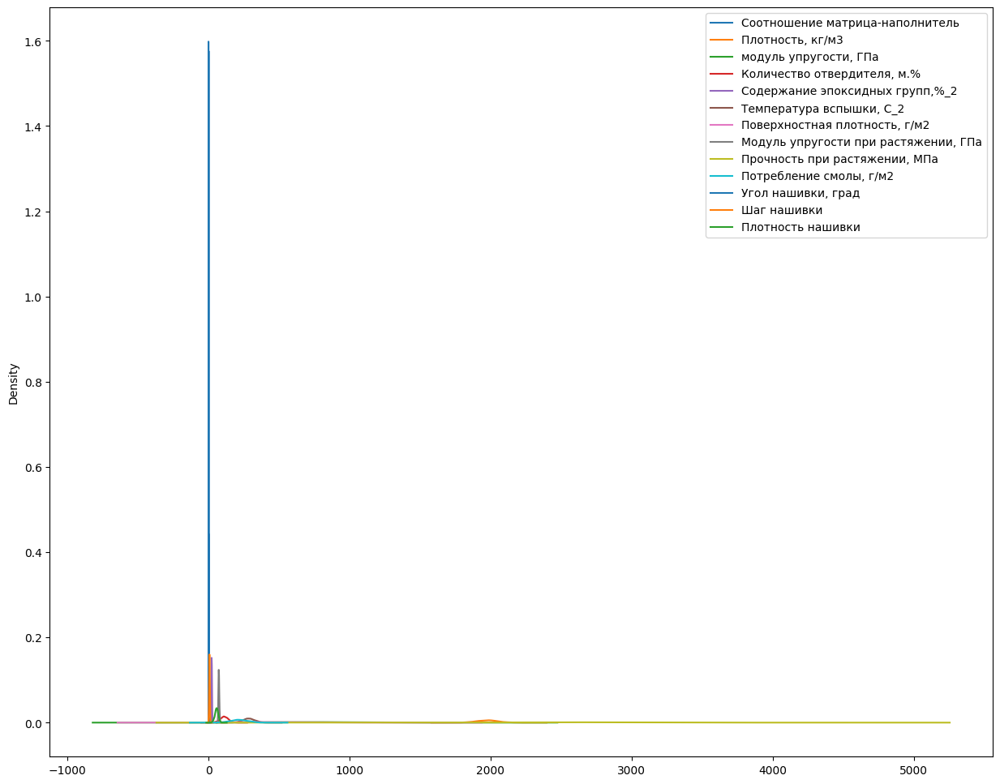

In [28]:
fig, ax = plt.subplots(figsize=(15, 12))
join_dataFrame_drop.plot(kind='kde', ax=ax)

## Видно, что данные находятся в разных диапазонах. Оценка плотности ядра показывает, что данные нужно нормализовать

In [29]:
scaler = preprocessing.MinMaxScaler()
names = join_dataFrame_drop.columns
d = scaler.fit_transform(join_dataFrame_drop)
join_dataFrame_drop_norm = pd.DataFrame(d, columns=names).round(2)
join_dataFrame_drop_norm.head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,0.28,0.60,0.45,0.12,0.61,0.48,0.16,0.32,0.7,0.52,0.0,0.28,0.54
1,0.28,0.60,0.45,0.61,0.42,0.55,0.16,0.32,0.7,0.52,0.0,0.34,0.37
2,0.46,0.60,0.46,0.50,0.50,0.48,0.16,0.32,0.7,0.52,0.0,0.34,0.50
3,0.46,0.53,0.45,0.50,0.50,0.48,0.16,0.32,0.7,0.52,0.0,0.34,0.54
4,0.42,0.31,0.49,0.50,0.50,0.48,0.16,0.32,0.7,0.52,0.0,0.34,0.68


## Описательная статистика характеристик после нормализации

In [30]:
join_dataFrame_drop_norm.describe().T.round(2)

,count,mean,std,min,25%,50%,75%,max
Соотношение матрица-наполнитель,999.0,0.49,0.17,0.0,0.37,0.48,0.61,1.0
"Плотность, кг/м3",999.0,0.47,0.18,0.0,0.34,0.47,0.58,1.0
"модуль упругости, ГПа",999.0,0.45,0.20,0.0,0.30,0.45,0.58,1.0
"Количество отвердителя, м.%",999.0,0.50,0.17,0.0,0.38,0.50,0.61,1.0
"Содержание эпоксидных групп,%_2",999.0,0.49,0.18,0.0,0.37,0.49,0.62,1.0
"Температура вспышки, С_2",999.0,0.49,0.17,0.0,0.37,0.49,0.61,1.0
"Поверхностная плотность, г/м2",999.0,0.37,0.22,0.0,0.21,0.35,0.54,1.0
"Модуль упругости при растяжении, ГПа",999.0,0.50,0.17,0.0,0.39,0.50,0.61,1.0
"Прочность при растяжении, МПа",999.0,0.51,0.17,0.0,0.39,0.50,0.61,1.0
"Потребление смолы, г/м2",999.0,0.51,0.17,0.0,0.40,0.51,0.62,1.0


In [31]:
join_dataFrame_drop_norm.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 999 entries, 0 to 998
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       999 non-null    float64
 1   Плотность, кг/м3                      999 non-null    float64
 2   модуль упругости, ГПа                 999 non-null    float64
 3   Количество отвердителя, м.%           999 non-null    float64
 4   Содержание эпоксидных групп,%_2       999 non-null    float64
 5   Температура вспышки, С_2              999 non-null    float64
 6   Поверхностная плотность, г/м2         999 non-null    float64
 7   Модуль упругости при растяжении, ГПа  999 non-null    float64
 8   Прочность при растяжении, МПа         999 non-null    float64
 9   Потребление смолы, г/м2               999 non-null    float64
 10  Угол нашивки, град                    999 non-null    float64
 11  Шаг нашивки        

## Оценим ящик с усами после нормализации

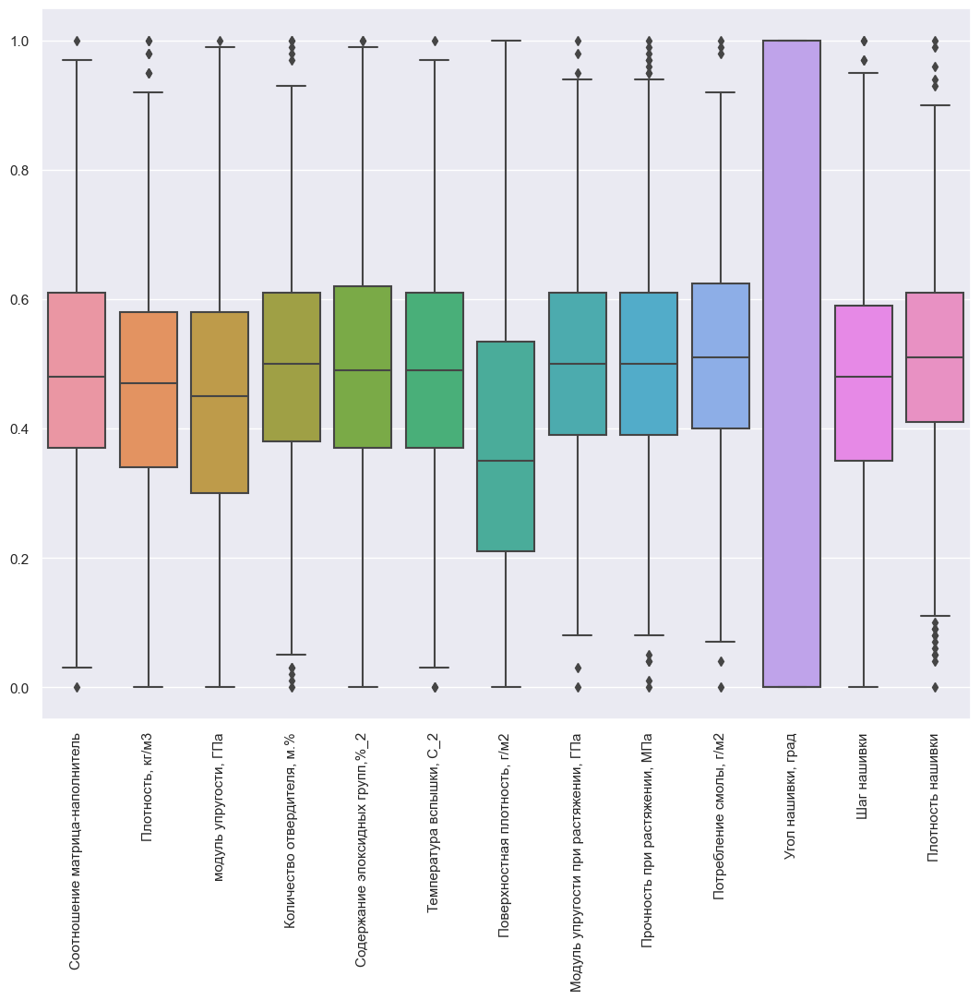

In [32]:
min_max_scaler = preprocessing.MinMaxScaler()
df_join_clean_norm = pd.DataFrame(min_max_scaler.fit_transform(join_dataFrame_drop),
    columns = join_dataFrame_drop.columns,
    index = join_dataFrame_drop.index)
sns.set(rc={'figure.figsize':(13,10)})
ax = sns.boxplot(data=join_dataFrame_drop_norm)
ax.set_xticklabels(ax.get_xticklabels(),rotation=90);

## Гистограмма после нормализации

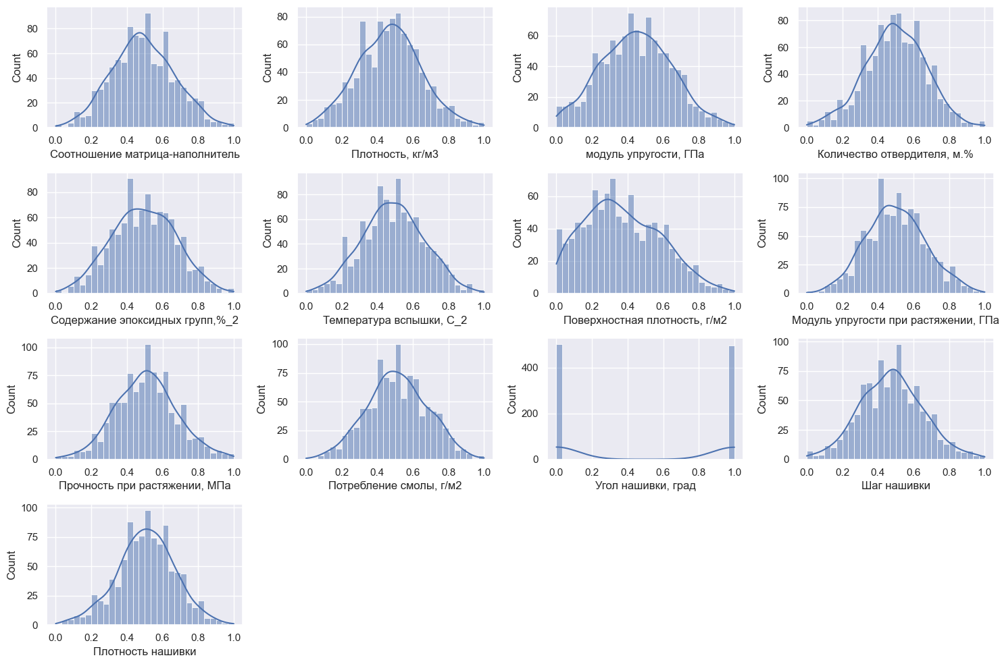

In [33]:
def histodraw(join_dataFrame_drop_norm, variables, n_rows, n_cols):
    fig=plt.figure(figsize=(15, 10))
    for i, var_name in enumerate(variables):
        ax=fig.add_subplot(n_rows,n_cols,i+1)
        sns.histplot(data=join_dataFrame_drop_norm, x=var_name, kde=True, bins=30)
    fig.tight_layout()
    plt.show()

histodraw(join_dataFrame_drop_norm, join_dataFrame_drop.columns, 4, 4)

# Корреляционная матрица после номализации данных

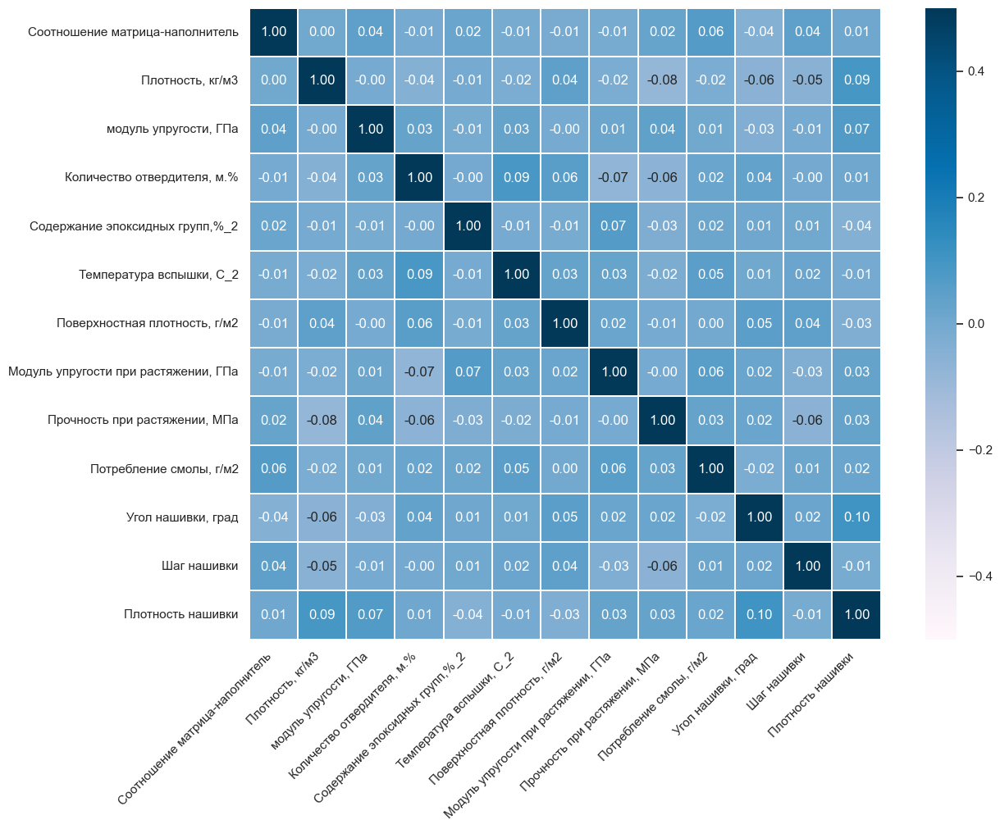

In [34]:
cor_map = join_dataFrame_drop_norm.corr()
fig, ax = plt.subplots(figsize=(14, 10))
sns.heatmap(cor_map, vmin=-0.5, vmax=0.5,  annot=True, square=True, fmt='.2f',cmap='PuBu', ax=ax, linewidths = 0.1)
plt.xticks(rotation=45, ha='right')
plt.show()

## Модели для прогноза модуля упругости при растяжении и прочности при растяжении.

# Входы и выходы для моделей

In [35]:
output_df_elastic = join_dataFrame_drop_norm['Модуль упругости при растяжении, ГПа']
output_df_strength = join_dataFrame_drop_norm['Прочность при растяжении, МПа']

input_df_elastic = join_dataFrame_drop_norm.loc[:, join_dataFrame_drop_norm.columns != 'Модуль упругости при растяжении, ГПа']
input_df_strength = join_dataFrame_drop_norm.loc[:, join_dataFrame_drop_norm.columns != 'Прочность при растяжении, МПа']

# Разделяем датасет на обучающую и тестовую выборки

In [36]:
X_input_elastic, X_output_elastic,  y_input_elastic, y_output_elastic = train_test_split(input_df_elastic, output_df_elastic , test_size=0.3, random_state=42)
X_input_strength, X_output_strength, y_input_strength, y_output_strength = train_test_split(input_df_strength, output_df_strength, test_size=0.3, random_state=42)

In [37]:
join_dataFrame_drop_norm.shape[0] - X_input_elastic.shape[0] - X_output_elastic.shape[0]
join_dataFrame_drop_norm.shape[0] - X_input_strength.shape[0] - X_output_strength.shape[0]

0

## Итоговый датасет ошибок

In [38]:
errors_df = pd.DataFrame(columns=['target_var','model_name','MSE','R2'])

## Определение функции для визуализации

In [39]:
def actual_and_predicted_plot(orig, predict, var, model_name):    
    plt.figure(figsize=(17,5))
    plt.title(f'Тестовые и прогнозные значения: {model_name}')
    plt.plot(orig, label='Тест')
    plt.plot(predict, label='Прогноз')
    plt.legend(loc='best')
    plt.ylabel(var)
    plt.xlabel('Количество наблюдений')
    plt.show()

## Линейная регрессия

In [40]:
# модуль упругости при растяжении

linear_model_elastic = LinearRegression()
linear_model_elastic.fit(X_input_elastic,  y_input_elastic)
prediction_y_test_linear_1 = linear_model_elastic.predict(X_output_elastic)


MSE_elastic = mean_squared_error(y_output_elastic, prediction_y_test_linear_1)
R2_elastic = r2_score(y_output_elastic, prediction_y_test_linear_1)

# прочность при растяжении
linear_model_pro = LinearRegression()
linear_model_pro.fit(X_input_strength, y_input_strength)
prediction_y_test_linear_2 = linear_model_pro.predict(X_output_strength)

MSE_strength = mean_squared_error(y_output_strength, prediction_y_test_linear_2)
R2_strength = r2_score(y_output_strength, prediction_y_test_linear_2)


linear_errors = pd.DataFrame({'model_name':'Linear Regression',\
                                'target_var':['Модуль упругости при растяжении, ГПа', 'Прочность при растяжении, МПа'],\
                               'MSE':[MSE_elastic, MSE_strength],\
                               'R2':[R2_elastic, R2_strength]})
errors_df = pd.concat([errors_df, linear_errors], ignore_index=True)
errors_df

,target_var,model_name,MSE,R2
0,"Модуль упругости при растяжении, ГПа",Linear Regression,0.027984,-0.027799
1,"Прочность при растяжении, МПа",Linear Regression,0.028827,-0.012278


## Визуализация

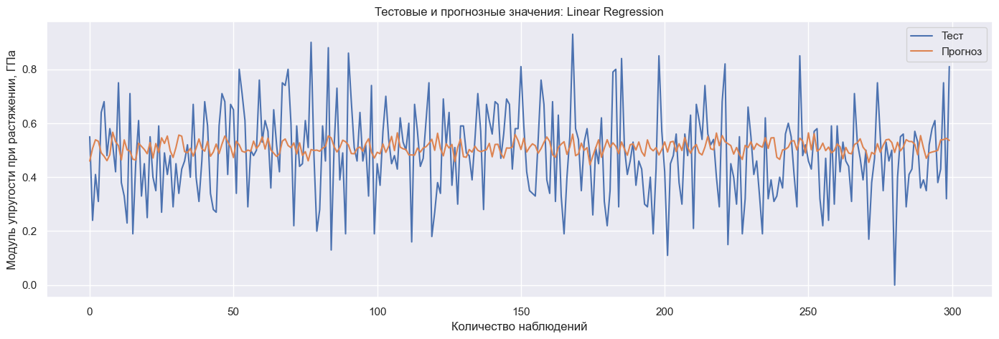

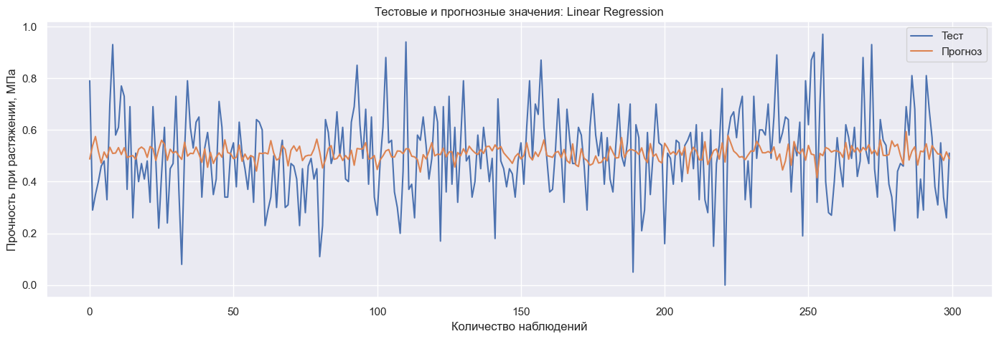

In [41]:
actual_and_predicted_plot(y_output_elastic.values, prediction_y_test_linear_1, 'Модуль упругости при растяжении, ГПа', 'Linear Regression')
actual_and_predicted_plot(y_output_strength.values, prediction_y_test_linear_2, 'Прочность при растяжении, МПа', 'Linear Regression')

##  Регрессия k-ближайших соседей

In [42]:


knr_model = KNeighborsRegressor()
neigh_params = {'n_neighbors' : range(1, 101, 1), 
          'weights' : ['uniform', 'distance'],
          'algorithm' : ['auto', 'ball_tree', 'kd_tree', 'brute']
          }

GSCV_neigh_1 = GridSearchCV(knr_model, neigh_params, n_jobs=-1, cv=10)
GSCV_neigh_1.fit(X_input_elastic,  y_input_elastic)
neigh_1 = GSCV_neigh_1.best_estimator_

MSE_upr = mean_squared_error(y_output_elastic, neigh_1.predict(X_output_elastic))
R2_upr = r2_score(y_output_elastic, neigh_1.predict(X_output_elastic))

GSCV_neigh_2 = GridSearchCV(knr_model, neigh_params, n_jobs=-1, cv=10)
GSCV_neigh_2.fit(X_input_strength, y_input_strength)
neigh_2 = GSCV_neigh_2.best_estimator_

MSE_pro = mean_squared_error(y_output_strength, neigh_2.predict(X_output_strength))
R2_pro = r2_score(y_output_strength, neigh_2.predict(X_output_strength))


neigh_errors = pd.DataFrame({'model_name':'KNeighbors',\
                                'target_var':['Модуль упругости при растяжении, ГПа', 'Прочность при растяжении, МПа'],\
                               'MSE':[MSE_upr, MSE_pro],\
                               'R2':[R2_upr, R2_pro]})
errors_df = pd.concat([errors_df, neigh_errors], ignore_index=True)
errors_df

,target_var,model_name,MSE,R2
0,"Модуль упругости при растяжении, ГПа",Linear Regression,0.027984,-0.027799
1,"Прочность при растяжении, МПа",Linear Regression,0.028827,-0.012278
2,"Модуль упругости при растяжении, ГПа",KNeighbors,0.027689,-0.016982
3,"Прочность при растяжении, МПа",KNeighbors,0.028884,-0.014285


## Визуализация

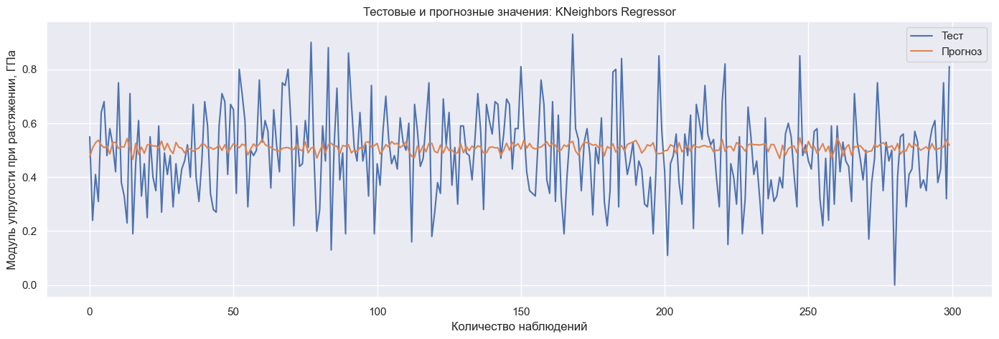

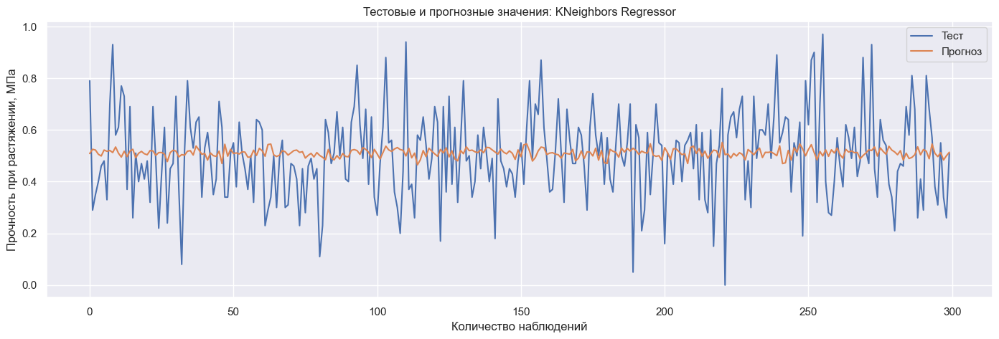

In [43]:
actual_and_predicted_plot(y_output_elastic.values, neigh_1.predict(X_output_elastic), 'Модуль упругости при растяжении, ГПа', 'KNeighbors Regressor')
actual_and_predicted_plot(y_output_strength.values, neigh_2.predict(X_output_strength), 'Прочность при растяжении, МПа', 'KNeighbors Regressor')

# Случайный лес

In [44]:
rfr_model = RandomForestRegressor(random_state=14)
rfr_model_params = {
    'n_estimators': [10, 50, 100],
    'max_depth': [None, 5, 10],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}
GSCV_rfr_model_upr = GridSearchCV(rfr_model, rfr_model_params, cv=5, verbose=2)
GSCV_rfr_model_upr.fit(X_input_elastic,  y_input_elastic)
rfr_model_upr = GSCV_rfr_model_upr.best_estimator_

MSE_upr = mean_squared_error(y_output_elastic, rfr_model_upr.predict(X_output_elastic))
R2_upr = r2_score(y_output_elastic, rfr_model_upr.predict(X_output_elastic))

GSCV_rfr_model_pro = GridSearchCV(rfr_model, rfr_model_params, cv=5, verbose=2)
GSCV_rfr_model_pro.fit(X_input_strength, y_input_strength)
rfr_model_pro = GSCV_rfr_model_pro.best_estimator_

MSE_pro = mean_squared_error(y_output_strength, rfr_model_pro.predict(X_output_strength))
R2_pro = r2_score(y_output_strength, rfr_model_pro.predict(X_output_strength))

rf_errors = pd.DataFrame({'model_name':'RandomForestRegressor',\
                                'target_var':['Модуль упругости при растяжении, ГПа', 'Прочность при растяжении, МПа'],\
                               'MSE':[MSE_upr, MSE_pro],\
                               'R2':[R2_upr, R2_pro]})
errors_df = pd.concat([errors_df, rf_errors], ignore_index=True)
errors_df

Fitting 5 folds for each of 81 candidates, totalling 405 fits
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=10; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=10; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=10; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=10; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=10; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=50; total time=   0.2s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=50; total time=   0.2s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=50; total time=   0.2s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=50; total time=   0.2s
[CV] END max_depth=N

,target_var,model_name,MSE,R2
0,"Модуль упругости при растяжении, ГПа",Linear Regression,0.027984,-0.027799
1,"Прочность при растяжении, МПа",Linear Regression,0.028827,-0.012278
2,"Модуль упругости при растяжении, ГПа",KNeighbors,0.027689,-0.016982
3,"Прочность при растяжении, МПа",KNeighbors,0.028884,-0.014285
4,"Модуль упругости при растяжении, ГПа",RandomForestRegressor,0.028550,-0.048606
5,"Прочность при растяжении, МПа",RandomForestRegressor,0.028805,-0.011492


## Визуализация

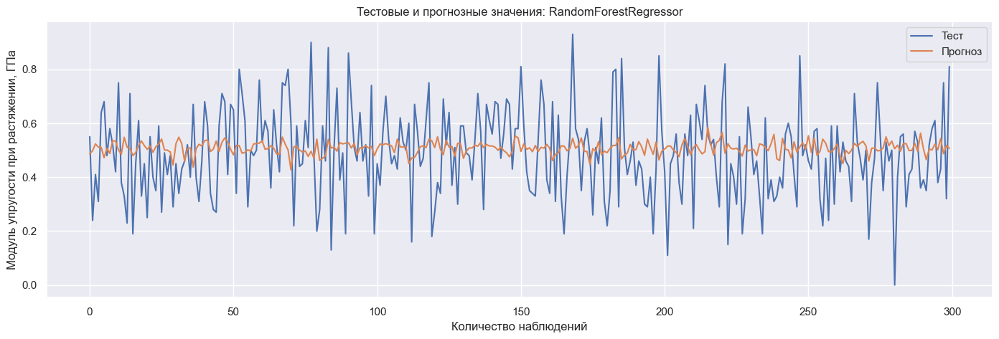

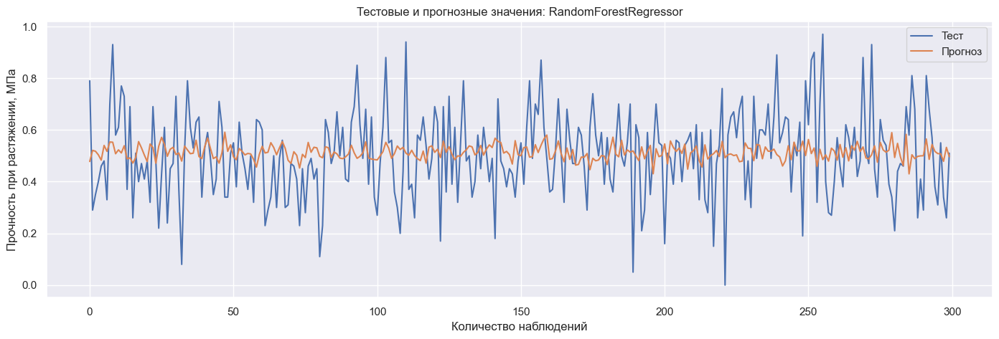

In [45]:
actual_and_predicted_plot(y_output_elastic.values, rfr_model_upr.predict(X_output_elastic), 'Модуль упругости при растяжении, ГПа', 'RandomForestRegressor')
actual_and_predicted_plot(y_output_strength.values, rfr_model_pro.predict(X_output_strength), 'Прочность при растяжении, МПа', 'RandomForestRegressor')

## Лассо регрессия

In [46]:
lasso_model = Lasso(random_state=14)
lasso_model_params = {
   'alpha': [0.01, 0.1, 1, 10]
}
GSCV_lasso_model_upr = GridSearchCV(lasso_model, lasso_model_params, cv=10, verbose=2)
GSCV_lasso_model_upr.fit(X_input_elastic,  y_input_elastic)


lasso_model_upr = GSCV_lasso_model_upr.best_estimator_

MSE_upr = mean_squared_error(y_output_elastic, lasso_model_upr.predict(X_output_elastic))
R2_upr = r2_score(y_output_elastic, lasso_model_upr.predict(X_output_elastic))

GSCV_lasso_model_pro = GridSearchCV(lasso_model, lasso_model_params, cv=10, verbose=2)
GSCV_lasso_model_pro.fit(X_input_strength, y_input_strength)


lasso_model_pro = GSCV_lasso_model_pro.best_estimator_
MSE_pro = mean_squared_error(y_output_strength, lasso_model_pro.predict(X_output_strength))
R2_pro = r2_score(y_output_strength, lasso_model_pro.predict(X_output_strength))

lasso_model_errors = pd.DataFrame({'model_name':'lasso',\
                                'target_var':['Модуль упругости при растяжении, ГПа', 'Прочность при растяжении, МПа'],\
                               'MSE':[MSE_upr, MSE_pro],\
                               'R2':[R2_upr, R2_pro]})
errors_df = pd.concat([errors_df, lasso_model_errors], ignore_index=True)
errors_df

Fitting 10 folds for each of 4 candidates, totalling 40 fits
[CV] END .........................................alpha=0.01; total time=   0.0s
[CV] END .........................................alpha=0.01; total time=   0.0s
[CV] END .........................................alpha=0.01; total time=   0.0s
[CV] END .........................................alpha=0.01; total time=   0.0s
[CV] END .........................................alpha=0.01; total time=   0.0s
[CV] END .........................................alpha=0.01; total time=   0.0s
[CV] END .........................................alpha=0.01; total time=   0.0s
[CV] END .........................................alpha=0.01; total time=   0.0s
[CV] END .........................................alpha=0.01; total time=   0.0s
[CV] END .........................................alpha=0.01; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END .......................................

,target_var,model_name,MSE,R2
0,"Модуль упругости при растяжении, ГПа",Linear Regression,0.027984,-0.027799
1,"Прочность при растяжении, МПа",Linear Regression,0.028827,-0.012278
2,"Модуль упругости при растяжении, ГПа",KNeighbors,0.027689,-0.016982
3,"Прочность при растяжении, МПа",KNeighbors,0.028884,-0.014285
4,"Модуль упругости при растяжении, ГПа",RandomForestRegressor,0.028550,-0.048606
5,"Прочность при растяжении, МПа",RandomForestRegressor,0.028805,-0.011492
6,"Модуль упругости при растяжении, ГПа",lasso,0.027706,-0.017617
7,"Прочность при растяжении, МПа",lasso,0.028507,-0.001026


## Визуализация

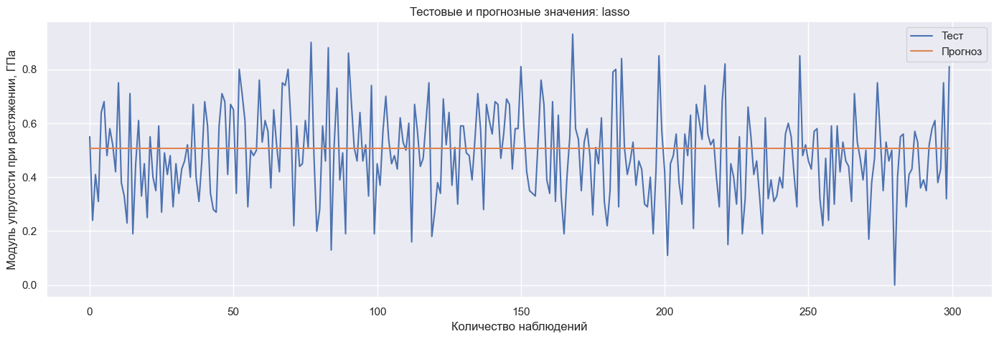

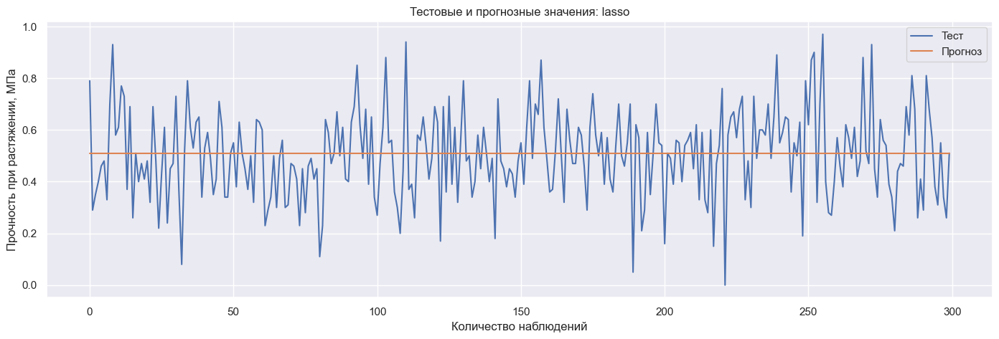

In [47]:
actual_and_predicted_plot(y_output_elastic.values, lasso_model_upr.predict(X_output_elastic), 'Модуль упругости при растяжении, ГПа', 'lasso')
actual_and_predicted_plot(y_output_strength.values, lasso_model_pro.predict(X_output_strength), 'Прочность при растяжении, МПа', 'lasso')

# Датасет с ошибками

In [48]:
errors_df

,target_var,model_name,MSE,R2
0,"Модуль упругости при растяжении, ГПа",Linear Regression,0.027984,-0.027799
1,"Прочность при растяжении, МПа",Linear Regression,0.028827,-0.012278
2,"Модуль упругости при растяжении, ГПа",KNeighbors,0.027689,-0.016982
3,"Прочность при растяжении, МПа",KNeighbors,0.028884,-0.014285
4,"Модуль упругости при растяжении, ГПа",RandomForestRegressor,0.028550,-0.048606
5,"Прочность при растяжении, МПа",RandomForestRegressor,0.028805,-0.011492
6,"Модуль упругости при растяжении, ГПа",lasso,0.027706,-0.017617
7,"Прочность при растяжении, МПа",lasso,0.028507,-0.001026


# Рекомендательная нейросеть для соотношения матрица-наполнитель

In [49]:
df_bp = pd.read_excel("Датасет для ВКР_композиты/X_bp.xlsx", index_col=0)
df_nup = pd.read_excel("Датасет для ВКР_композиты/X_nup.xlsx", index_col=0)

In [50]:
df = df_bp.merge(df_nup, left_index = True, right_index = True, how = 'inner')

## Сформируем входы и выходы для моделей, разделим обучающую и тестовую

In [51]:
x = df.drop(['Соотношение матрица-наполнитель'], axis=1)
y = df[['Соотношение матрица-наполнитель']]

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=42)

## Нормализация

In [52]:
x_train_norm = tf.keras.layers.Normalization(axis=-1)
x_train_norm.adapt(np.array(x_train))

## Cлои и конфиг нейросети

In [53]:
model = tf.keras.Sequential([x_train_norm, layers.Dense(128, activation='relu'),  
                                                 layers.Dense(64, activation='relu'),
                                                 layers.Dense(32, activation='relu'), 
                                                 layers.Dense(16, activation='relu'), 
                                                 layers.Dense(1)
                            ])

model.compile(optimizer = tf.keras.optimizers.Adam(0.001), loss = 'mean_squared_error')  


model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 normalization (Normalizatio  (None, 12)               25        
 n)                                                              
                                                                 
 dense (Dense)               (None, 128)               1664      
                                                                 
 dense_1 (Dense)             (None, 64)                8256      
                                                                 
 dense_2 (Dense)             (None, 32)                2080      
                                                                 
 dense_3 (Dense)             (None, 16)                528       
                                                                 
 dense_4 (Dense)             (None, 1)                 17        
                                                        

In [54]:
history = model.fit(x_train, y_train, epochs=100, validation_split=0.2)

Epoch 1/100
18/18 [==============================] - 1s 9ms/step - loss: 7.0308 - val_loss: 3.4226
Epoch 2/100
18/18 [==============================] - 0s 2ms/step - loss: 1.9938 - val_loss: 1.9722
Epoch 3/100
18/18 [==============================] - 0s 2ms/step - loss: 1.2086 - val_loss: 1.1911
Epoch 4/100
18/18 [==============================] - 0s 2ms/step - loss: 1.0572 - val_loss: 1.1686
Epoch 5/100
18/18 [==============================] - 0s 2ms/step - loss: 0.9919 - val_loss: 1.0873
Epoch 6/100
18/18 [==============================] - 0s 2ms/step - loss: 0.9567 - val_loss: 1.0845
Epoch 7/100
18/18 [==============================] - 0s 2ms/step - loss: 0.9160 - val_loss: 1.0791
Epoch 8/100
18/18 [==============================] - 0s 2ms/step - loss: 0.8851 - val_loss: 1.0699
Epoch 9/100
18/18 [==============================] - 0s 2ms/step - loss: 0.8539 - val_loss: 1.0768
Epoch 10/100
18/18 [==============================] - 0s 2ms/step - loss: 0.8213 - val_loss: 1.0550
Epoch 11/

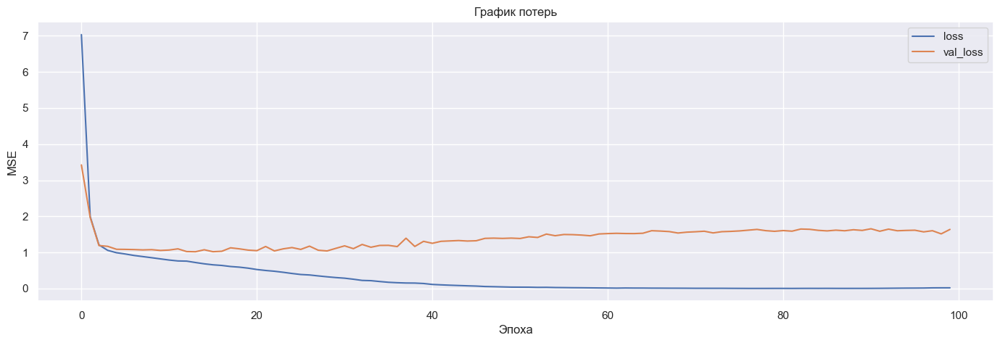

In [55]:
def model_loss_plot(history):
    plt.figure(figsize=(17,5))
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('График потерь')
    plt.ylabel('MSE')
    plt.xlabel('Эпоха')
    plt.legend(['loss', 'val_loss'], loc='best')
    plt.show()
model_loss_plot(history)

10/10 [==============================] - 0s 776us/step


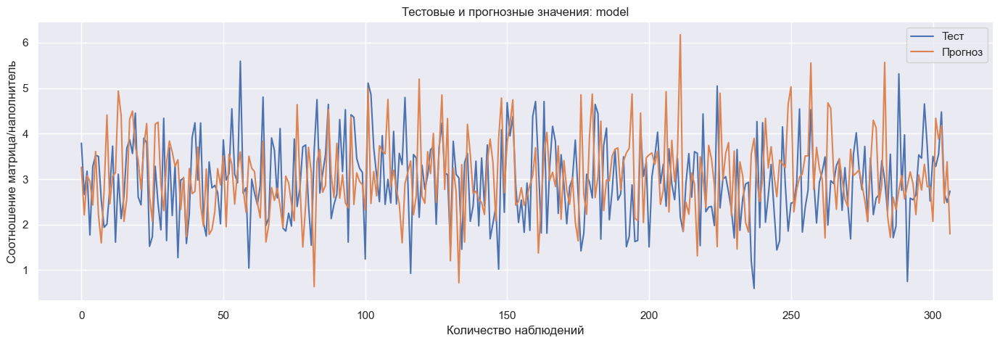

In [59]:
actual_and_predicted_plot(y_test.values, model.predict(x_test.values), 'Cоотношение матрица/наполнитель', 'model')

In [57]:
MSE = mean_squared_error(y_test, model.predict(x_test.values))
R2 = r2_score(y_test, model.predict(x_test.values))

keras_mlpr_model_errors = pd.DataFrame({'model_name':'Нейросеть',\
                                    'target_var':['Соотношение матрица/наполнитель'],\
                                    'MSE':[MSE],\
                                    'R2':[R2]})
errors_df = pd.concat([errors_df, keras_mlpr_model_errors], ignore_index=True)
errors_df

10/10 [==============================] - 0s 776us/step


,target_var,model_name,MSE,R2
0,"Модуль упругости при растяжении, ГПа",Linear Regression,0.027984,-0.027799
1,"Прочность при растяжении, МПа",Linear Regression,0.028827,-0.012278
2,"Модуль упругости при растяжении, ГПа",KNeighbors,0.027689,-0.016982
3,"Прочность при растяжении, МПа",KNeighbors,0.028884,-0.014285
4,"Модуль упругости при растяжении, ГПа",RandomForestRegressor,0.028550,-0.048606
5,"Прочность при растяжении, МПа",RandomForestRegressor,0.028805,-0.011492
6,"Модуль упругости при растяжении, ГПа",lasso,0.027706,-0.017617
7,"Прочность при растяжении, МПа",lasso,0.028507,-0.001026
8,Соотношение матрица/наполнитель,Нейросеть,1.579331,-0.842565


In [58]:
y_pred = model.predict(x_test)
r2 = r2_score(y_test, y_pred)
print("R-squared Score:", r2)

10/10 [==============================] - 0s 665us/step
R-squared Score: -0.8425652175805021


In [60]:
import pickle

In [62]:
pickle.dump(model, open ('model.pkl', 'wb'))